In [1]:
import scvelo as scv
import scanpy as spy
import numpy as np  

import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib.axes._axes import _log as matplotlib_axes_logger
matplotlib_axes_logger.setLevel('ERROR')
import json
import anndata
import pandas as pd
import scprep

import multraj.visual as visual
import multraj.clustering as clust
import multraj.pp as pp
import multraj.path as path
import multraj.nn as nn
import multraj.princurve as pcurve
import multraj.benchmark as bmk


from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.kernel_ridge import KernelRidge

## Meta-cell construction

In [2]:
# read in simulated dataset
adata = anndata.read_h5ad("./sim_data/Dyngen/two_batches_clustered.h5ad")

In [3]:
# number of clusters
clusters = 400 # 500
# number of trials
n_trials = 10
# cluster obj

clust.cluster_cells(adata, n_clusters = clusters, n_init = n_trials)

X_cluster, velo_cluster = clust.meta_cells(adata)
# number of clusters
groups = adata.obs['groups']

Already conducted clustering


The clusters with radius close to 0 has components number:
1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

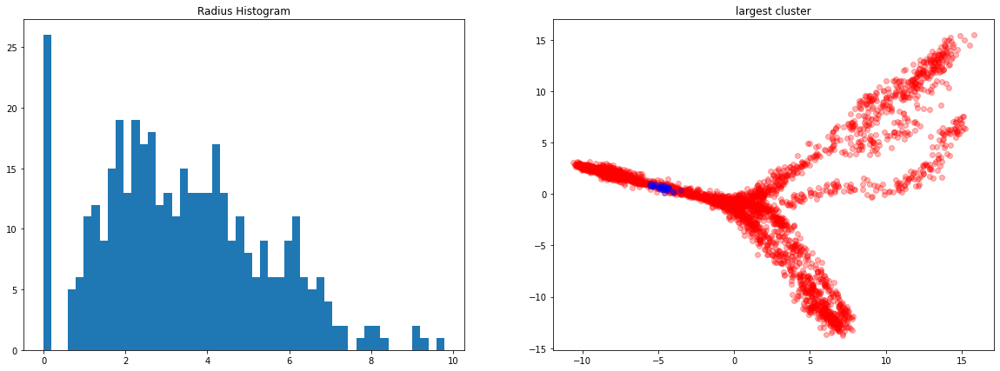

In [4]:
max_group = visual.radius_hist(adata, scaling=50)

## Neighborhood graph construction

make symmetric by adding


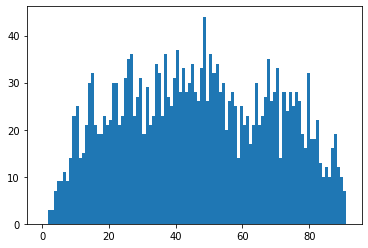

In [5]:
k = 10 
adj_matrix,dist_matrix = nn.NeighborhoodGraph(X_cluster,k, symm = True, pruning=False)
adj_assigned, max_weight = nn.assign_weights(adj_matrix,dist_matrix, X_cluster, velo_cluster,scaling = 3,\
                              distance_scaler = 0.5,thresholding = 0.0)
visual.weight_histogram(adj_assigned, scaling=100,upper=max_weight)

## Meta-cell level paths inference

In [6]:
paths, opt = path.dijkstra_paths(adj_assigned, indeg = [0,1,2])
clusters = int(np.max(groups)+1)
greedy_paths, paths = path.greedy_selection(clusters, paths, opt, threshold = 0.5, max_w=max_weight, cut_off=5, verbose=True, length_bias=0.7, max_trajs = 15)

cut off small paths and conduct quality control
selected path (starting_ending):
start_end:  22_236 , len:  31 newly covered: 31
start_end:  142_316 , len:  29 newly covered: 18
start_end:  162_98 , len:  27 newly covered: 11
start_end:  306_59 , len:  27 newly covered: 9
start_end:  22_107 , len:  30 newly covered: 3
start_end:  22_375 , len:  31 newly covered: 2
start_end:  22_242 , len:  29 newly covered: 3
start_end:  22_353 , len:  30 newly covered: 2
start_end:  22_69 , len:  29 newly covered: 2
start_end:  22_37 , len:  29 newly covered: 2
start_end:  22_86 , len:  29 newly covered: 2
start_end:  22_270 , len:  29 newly covered: 2
start_end:  22_64 , len:  26 newly covered: 4
start_end:  22_348 , len:  30 newly covered: 1
start_end:  22_47 , len:  27 newly covered: 3
Finished


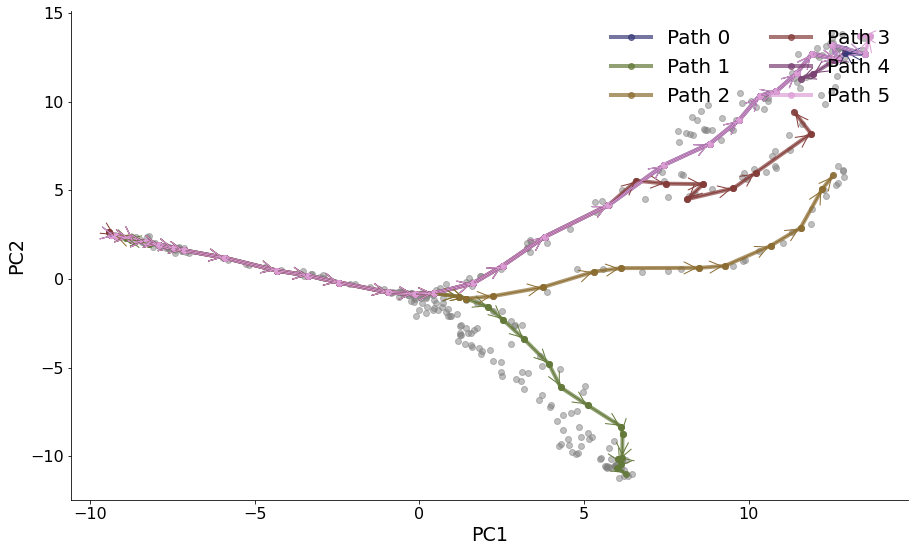

In [7]:
trajs = 6
visual.meta_traj_visual(X_cluster, paths, greedy_paths, trajs = trajs, figsize = (15,9), save_as = None)#"./sim_results/Symsim/cycle_tree/rand1/clust_paths.pdf")

## Cell-level pseudo-time inference

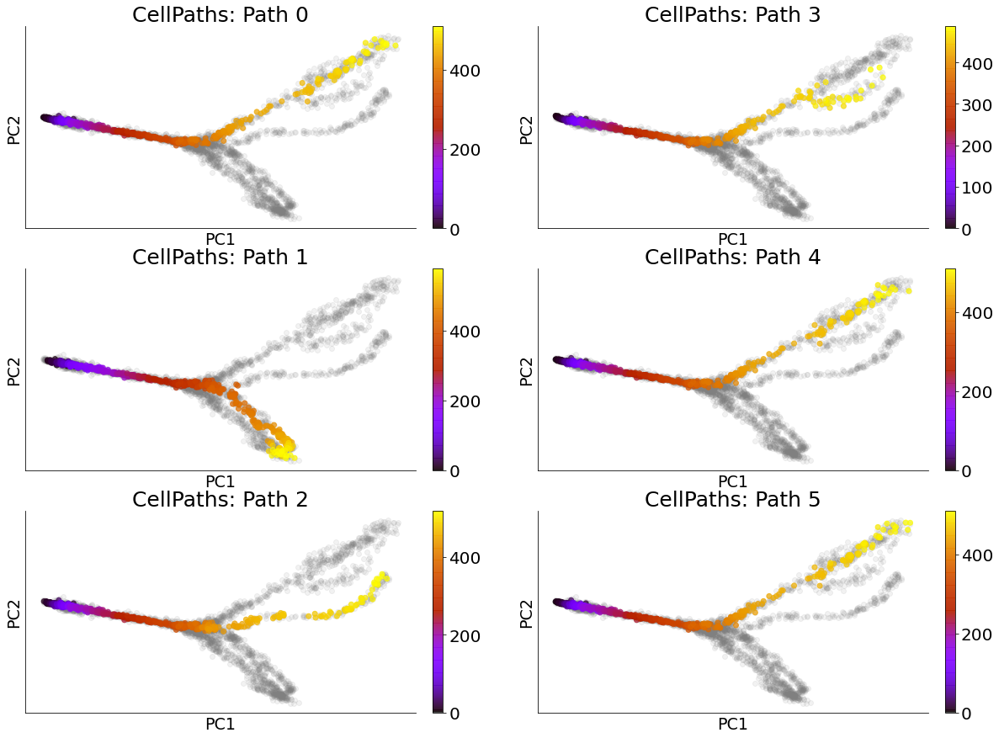

In [8]:
pseudo_order = visual.first_order_approx_pt(adata, paths, greedy_paths, X_cluster, velo_cluster, basis = 'pca', groups = None, trajs = trajs, figsize= (20,15), save_as = None)#"./sim_results/Dyngen/DoubleBatches/first_order_pt.pdf")

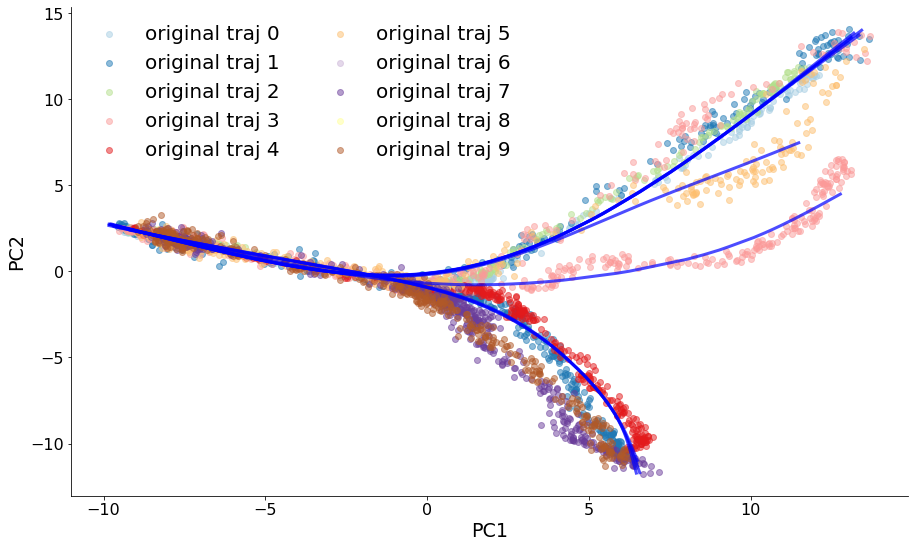

In [9]:
pc_pt_order = visual.traj_visual(adata, paths, greedy_paths, trajs = 9, projection = '2d', figsize = (15,9), elev = 30, azim = 10, save_as = None, cmap = "Paired")

# Benchmark
## CellPaths
### Kendall-tau test


In [10]:
non_zeros = {}
pt_pred = {}
pt_true = {}
kt = {}
for icol, col in enumerate(pseudo_order.columns):
    non_zeros[col] = np.where(~np.isnan(pseudo_order[col].values.squeeze()))[0]
    pt_pred[col] = pseudo_order.iloc[non_zeros[col], icol].values.squeeze()
    pt_true[col] = adata.obs["sim_time"].iloc[non_zeros[col]].values
    kt[col] = bmk.kendalltau(pt_pred[col], pt_true[col])

### Topology

In [11]:
bmk.f1_score(adata, method="CellPaths", paths = paths, greedy_paths = greedy_paths, trajs = 10)

recovery

inferred trajectory: 0 jaccard: 0.1919889502762431
inferred trajectory: 1 jaccard: 0.19388954171562867
inferred trajectory: 2 jaccard: 0.1553133514986376
inferred trajectory: 3 jaccard: 0.15862068965517243
inferred trajectory: 4 jaccard: 0.1919889502762431
inferred trajectory: 5 jaccard: 0.1919889502762431
inferred trajectory: 6 jaccard: 0.19838523644752018
inferred trajectory: 7 jaccard: 0.1919889502762431
inferred trajectory: 8 jaccard: 0.1997690531177829
inferred trajectory: 9 jaccard: 0.19305555555555556
recovery value: 0.18669892290952697
relevence

ori trajectory: 1 jaccard: 0.15251989389920426
ori trajectory: 2 jaccard: 0.12758620689655173
ori trajectory: 3 jaccard: 0.19305555555555556
ori trajectory: 4 jaccard: 0.1553133514986376
ori trajectory: 5 jaccard: 0.1997690531177829
ori trajectory: 6 jaccard: 0.03571428571428571
ori trajectory: 8 jaccard: 0.01161751563896336
ori trajectory: 10 jaccard: 0.018108651911468814
relevence value: 0.11171056427905625


0.1397827007781086

In [12]:
bmk_belongings = bmk.purity_count(adata, method = "CellPaths", paths = paths, greedy_paths = greedy_paths, trajs = 5)
entro = bmk.average_entropy(adata, bmk_belongings)
entro

1.7452247339705074

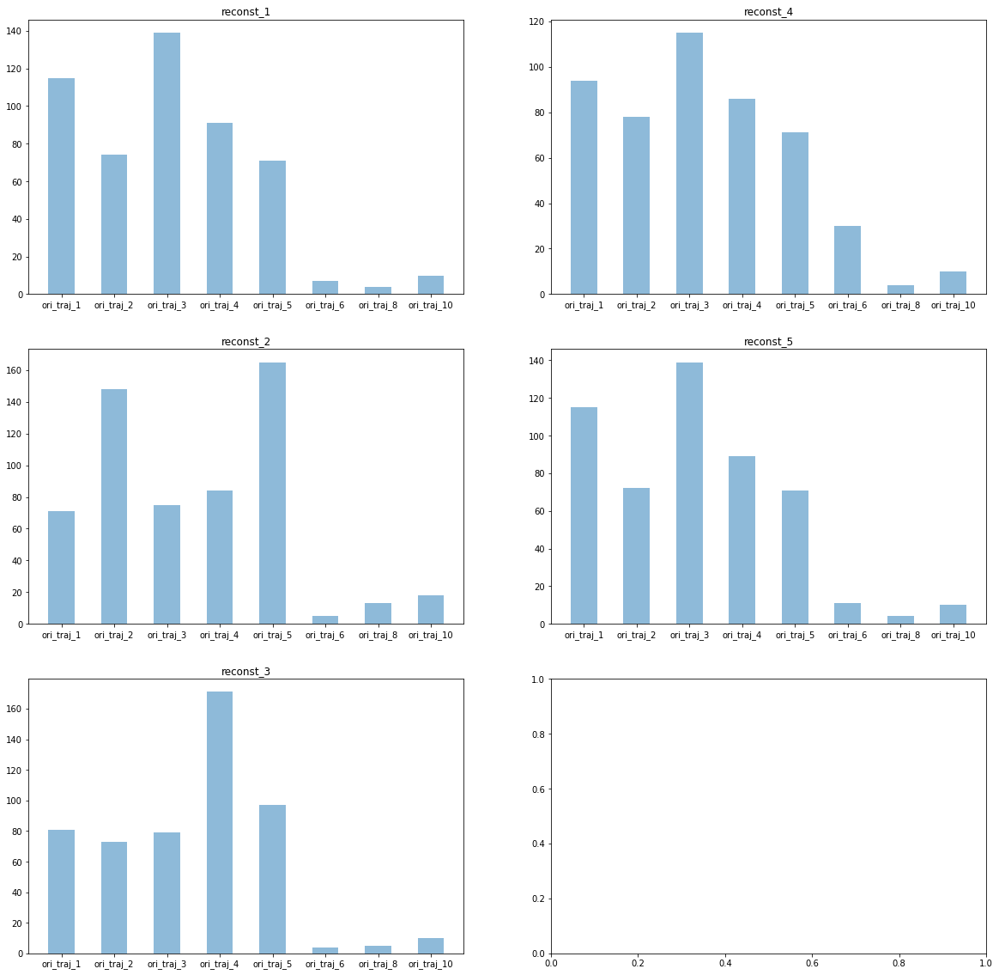

In [13]:
visual.purity_bar(bmk_belongings, figsize=(20,20))

### Slingshot

In [14]:
adata = anndata.read_h5ad("./sim_data/Dyngen/two_batches.h5ad")
X_pca = adata.obsm['X_pca']

n_clusters = 10
init = "k-means++"
n_init = 10
max_iter = 300
tol = 0.0001
kmeans = KMeans(n_clusters, init, n_init, max_iter, tol)
groups = kmeans.fit_predict(X_pca)
meta_data = adata.obs
meta_data['groups'] = groups

Text(0.5, 1.0, 'slingshot clusters')

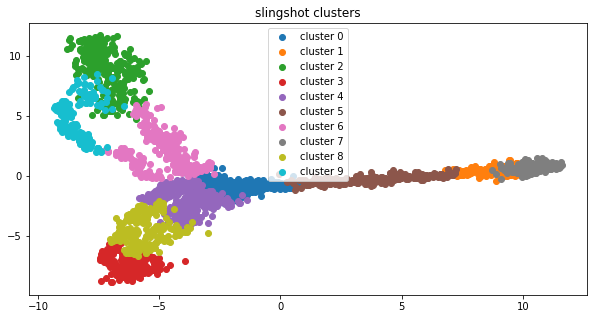

In [15]:
fig = plt.figure(figsize = (10,5))
ax = fig.add_subplot()
c_range = [eval(x) if isinstance(x, str) else x for x in adata.obs['sim_time']]
clusters = int(np.max(groups)+1)
for i in range(clusters):
    sub_cells = np.where(groups == i)[0]
    progression = ax.scatter(X_pca[sub_cells,0], X_pca[sub_cells,1], cmap = plt.get_cmap('Pastel1'))
    # progression = ax.scatter(X_umap[sub_cells,0], X_umap[sub_cells,1], cmap = plt.get_cmap('Pastel1'))

ax.legend(['cluster '+ str(i) for i in range(clusters)])
ax.set_title("slingshot clusters")
# fig.savefig("./syn_results/dataset1/slingshot_clust.pdf")

In [16]:
X_pca_df = pd.DataFrame(index=[str(x) for x in range(X_pca.shape[0])], columns= np.arange(2), data = X_pca[:,0:2])
# scprep.run.install_bioconductor('slingshot')
results = scprep.run.Slingshot(X_pca_df, meta_data['groups'], start_cluster = 7)

R[write to console]: Using full covariance matrix


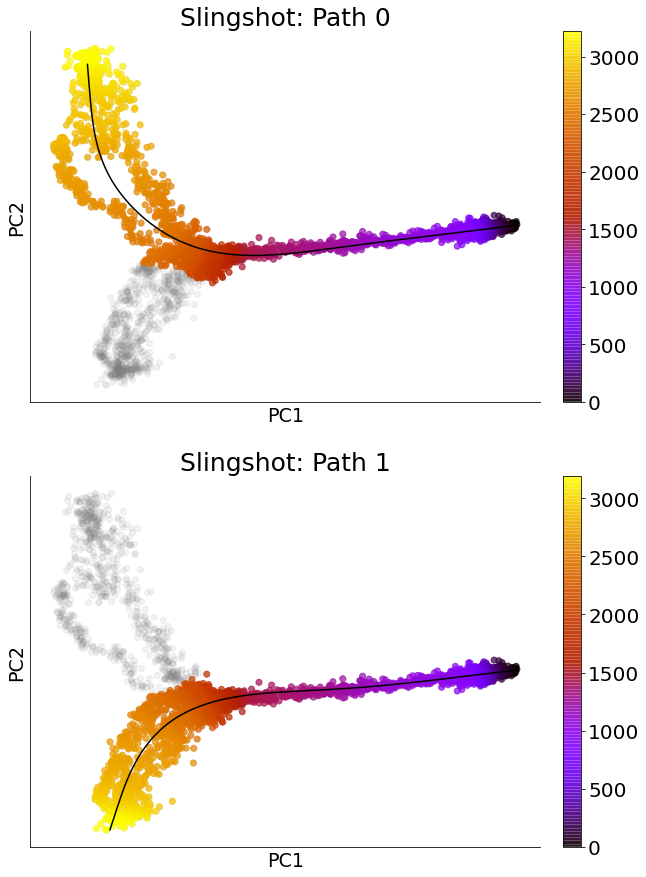

In [17]:
kt_slingshot = visual.slingshot_visual(adata,  results, basis= "pca", figsize=(10,15), save_as = None)#"./sim_results/Dyngen/DoubleBatches/plot/slingshot_result.pdf")

[Text(0, 0, ''),
 Text(0, 0, 'CellPaths'),
 Text(0, 0, 'Slingshot'),
 Text(0, 0, '')]

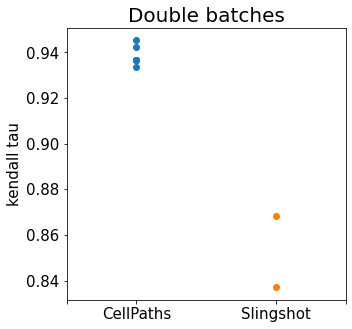

In [18]:
fig = plt.figure(figsize = (5,5))
ax = fig.add_subplot()
ax.scatter([0 for x in kt.values()], [x for x in kt.values()])
ax.scatter([1 for x in kt_slingshot.values()], [x for x in kt_slingshot.values()])
ax.set_title("Double batches", fontsize = 20)
ax.set_ylabel("kendall tau", fontsize = 15)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)

plt.xticks([-0.5,0,1,1.5],fontsize = 15)
labels = [item.get_text() for item in ax.get_xticklabels()]
labels[0] = ""
labels[1] = "CellPaths"
labels[2] = "Slingshot"
labels[3] = ""
ax.set_xticklabels(labels)

# fig.savefig("./sim_results/Dyngen/DoubleBatches/quantity/boxplot.pdf", bbox_inches = "tight")

In [19]:
bmk.f1_score(adata, method="Slingshot", slingshot_result = results, trajs = None)

recovery

inferred trajectory: 0 jaccard: 0.23354037267080746
inferred trajectory: 1 jaccard: 0.18316234158117078
recovery value: 0.20835135712598912
relevence

ori trajectory: 1 jaccard: 0.1124223602484472
ori trajectory: 2 jaccard: 0.18316234158117078
ori trajectory: 3 jaccard: 0.1093167701863354
ori trajectory: 4 jaccard: 0.23354037267080746
ori trajectory: 5 jaccard: 0.13583724569640063
ori trajectory: 6 jaccard: 0.1186335403726708
ori trajectory: 8 jaccard: 0.17324561403508773
ori trajectory: 10 jaccard: 0.13565162907268172
relevence value: 0.1502262342329502


0.1745777791620586

In [20]:
bmk_belongings = bmk.purity_count(adata, method = "Slingshot", slingshot_result = results, trajs = None)
entro = bmk.average_entropy(adata, bmk_belongings)
entro

2.0138347966069503

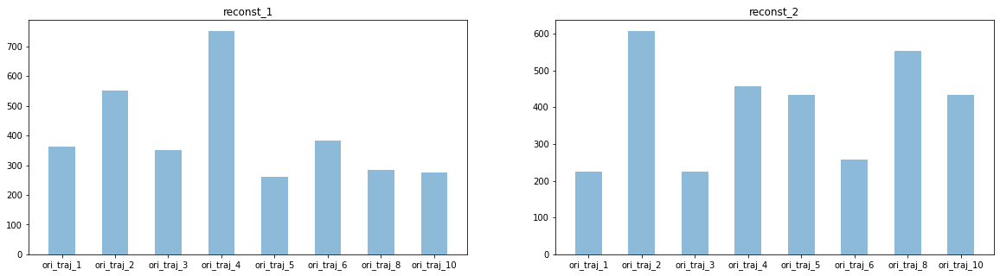

In [22]:
visual.purity_bar(bmk_belongings, figsize=(20,5))